# 1. Завантаження середовища
## Функція показу средовища

In [12]:
from matplotlib import pyplot as plt


def show_render(img):
    # Відображення зображення
    plt.imshow(img)
    plt.axis('off')  # Вимкнути вісі
    plt.show()


## Завантажуємо середовище

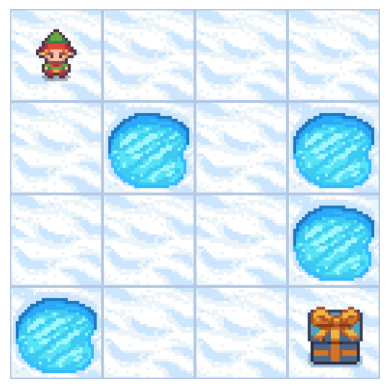

In [13]:
import gymnasium as gym

# env = gym.make('FrozenLake-v1',render_mode='rgb_array')
env=gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=True,render_mode="rgb_array")

# Ініціалізація середовища
observation = env.reset()

# Візуалізація середовища з режимом 'ansi'
show_render(env.render())

# 2. Описуємо обробку політик
## Функція ітерації значеннями середовища

In [14]:
import numpy as np


def value_iteration(env, gamma = 1.0):

    # initialize value table with zeros
    value_table = np.zeros(env.observation_space.n)

    # set number of iterations and threshold
    no_of_iterations = 100000
    threshold = 1e-20

    for i in range(no_of_iterations):

        # On each iteration, copy the value table to the updated_value_table
        updated_value_table = np.copy(value_table)

        # Now we calculate Q Value for each actions in the state
        # and update the value of a state with maximum Q value

        for state in range(env.observation_space.n):
            Q_value = []
            for action in range(env.action_space.n):
                next_states_rewards = []
                for next_sr in env.P[state][action]:
                    trans_prob, next_state, reward_prob, _ = next_sr
                    next_states_rewards.append((trans_prob * (reward_prob + gamma * updated_value_table[next_state])))

                Q_value.append(np.sum(next_states_rewards))

            value_table[state] = max(Q_value)

        # we will check whether we have reached the convergence i.e whether the difference
        # between our value table and updated value table is very small. But how do we know it is very
        # small? We set some threshold and then we will see if the difference is less
        # than our threshold, if it is less, we break the loop and return the value function as optimal
        # value function

        if (np.sum(np.fabs(updated_value_table - value_table)) <= threshold):
             print ('Value-iteration converged at iteration# %d.' %(i+1))
             break

    return value_table


## Розпаковуємо політику

In [15]:
def extract_policy(env, value_table, gamma=1.0):
    """
    Policy improvement: жадібне покращення політики за V(s).
    """
    assert hasattr(env.unwrapped, "P"), "Це середовище не надає P. Використайте env.unwrapped.P або інше дискретне середовище (FrozenLake-v1, Taxi-v3)."
    nS = env.observation_space.n
    nA = env.action_space.n
    P = env.unwrapped.P

    policy = np.zeros(nS, dtype=np.int32)
    for s in range(nS):
        Qs = np.zeros(nA, dtype=np.float64)
        for a in range(nA):
            q = 0.0
            for trans_prob, next_state, reward, _ in P[s][a]:
                q += trans_prob * (reward + gamma * value_table[next_state])
            Qs[a] = q
        policy[s] = int(np.argmax(Qs))
    return policy

## Функція обчислення цінності

In [16]:
def compute_value_function(env, policy, gamma=1.0, theta=1e-8, max_iterations=10**6):
    """
    Policy evaluation: обчислює V^pi за фіксованої політики policy.
    Працює лише для дискретних середовищ з моделлю переходів env.unwrapped.P.
    """
    assert hasattr(env.unwrapped, "P"), "Це середовище не надає P. Використайте env.unwrapped.P або інше дискретне середовище (FrozenLake-v1, Taxi-v3)."
    nS = env.observation_space.n
    V = np.zeros(nS, dtype=np.float64)
    P = env.unwrapped.P

    for _ in range(int(max_iterations)):
        delta = 0.0
        for s in range(nS):
            a = policy[s]
            v = 0.0
            for trans_prob, next_state, reward, _ in P[s][a]:
                v += trans_prob * (reward + gamma * V[next_state])
            delta = max(delta, abs(v - V[s]))
            V[s] = v
        if delta < theta:
            break
    return V

## Функція ітерації політик

In [17]:
def policy_iteration(env, gamma=1.0, theta=1e-8, max_iterations=1000):
    """
    Policy Iteration: чергує оцінювання політики та її покращення, поки політика не стабілізується.
    Повертає (policy, value_function).
    """
    assert hasattr(env.unwrapped, "P"), "Це середовище не надає P. Використайте env.unwrapped.P або інше дискретне середовище (FrozenLake-v1, Taxi-v3)."
    nS = env.observation_space.n
    # Початкова політика: дія 0 у всіх станах (можете рандомізувати)
    policy = np.zeros(nS, dtype=np.int32)

    for _ in range(max_iterations):
        V = compute_value_function(env, policy, gamma=gamma, theta=theta)
        new_policy = extract_policy(env, V, gamma=gamma)
        if np.array_equal(new_policy, policy):
            return new_policy, V
        policy = new_policy
    # Якщо не збіглося в межах max_iterations, все одно повертаємо поточне
    return policy, V

# 4. Спробуємо навчити гнома з підкріпленням
## Функція навчання з підкріпленням з змінною гаммою

In [18]:
def reinforced_learn(gamma):
    env=gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=True,render_mode="rgb_array")
    best_policy, V = policy_iteration(env, gamma=gamma)

    # Виконання епізоду з найкращою політикою:
    obs, _ = env.reset()
    done = False
    total_reward = 0.0
    while not done:
        action = best_policy[obs]
        step = env.step(action)
        show_render(env.render())
        # Підтримка як старого, так і нового API Gym/Gymnasium:
        if len(step) == 5:
            obs, reward, terminated, truncated, info = step
            done = terminated or truncated
        else:
            obs, reward, done, info = step
        total_reward += reward

## Гамма 0

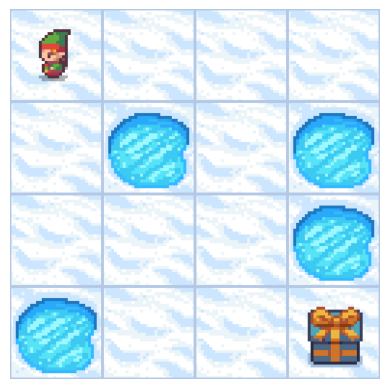

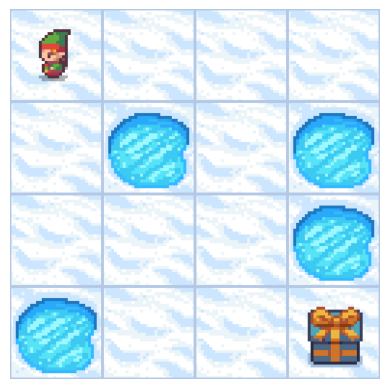

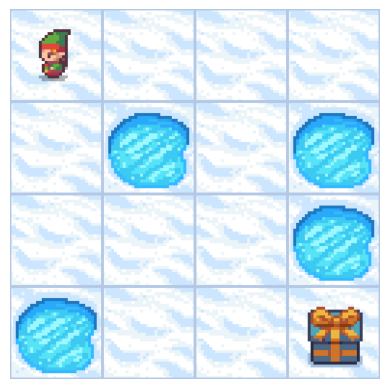

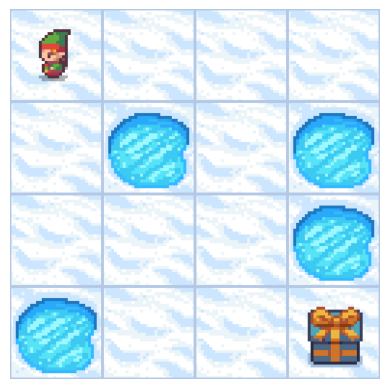

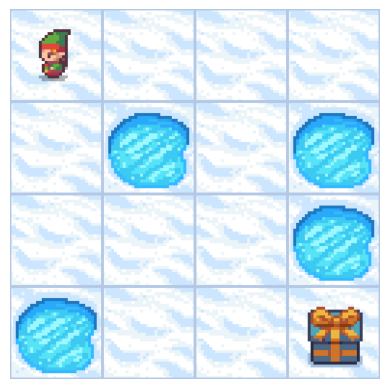

...

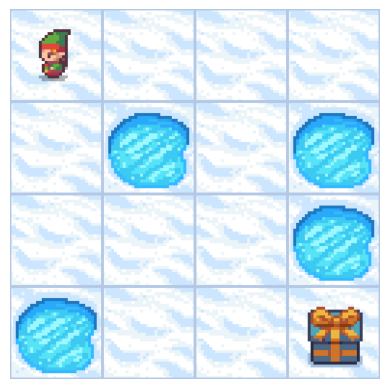

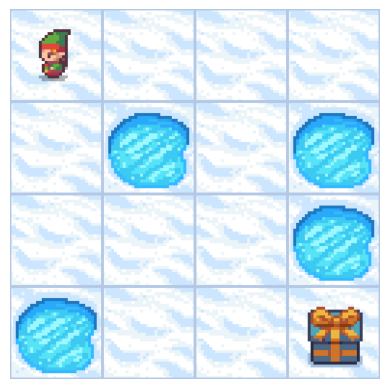

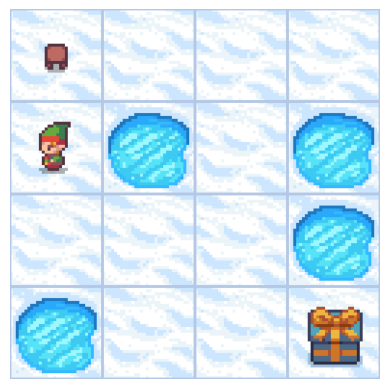

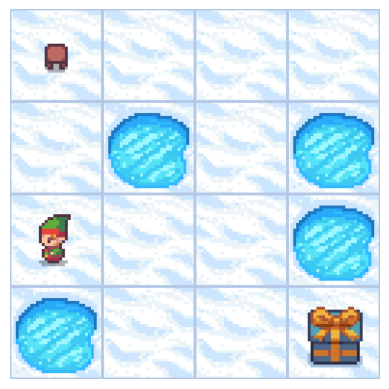

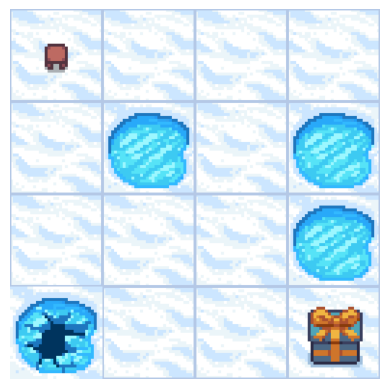

In [19]:
reinforced_learn(0)

## Гамма 0.05

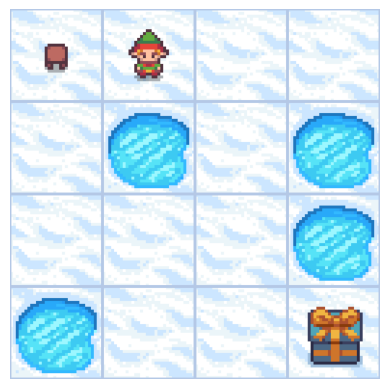

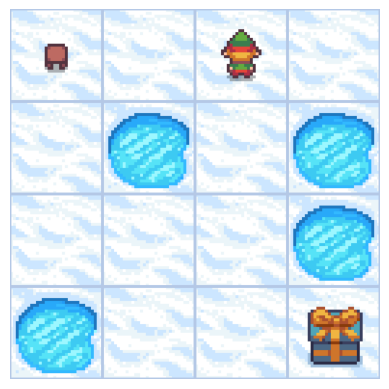

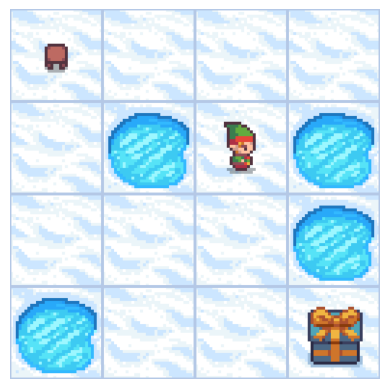

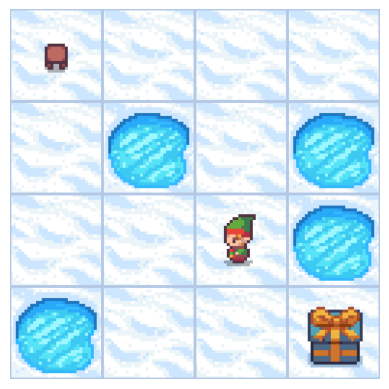

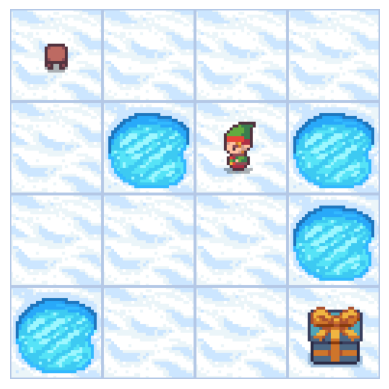

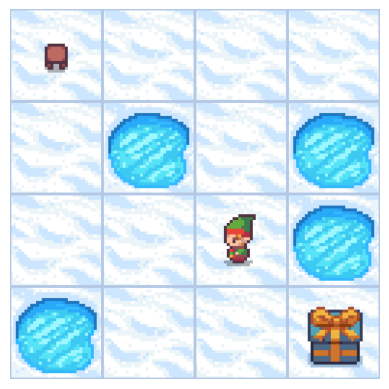

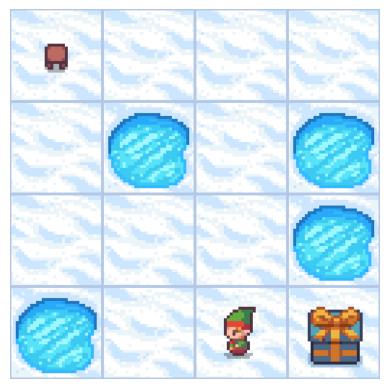

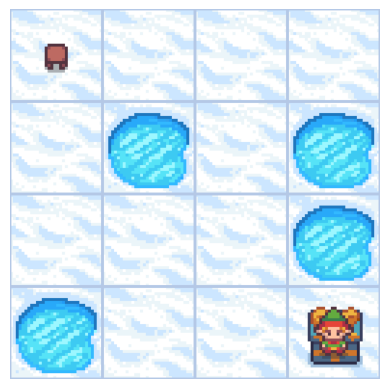

In [20]:
reinforced_learn(0.05)

## Гамма 0.5

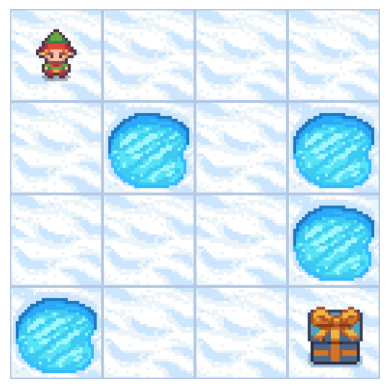

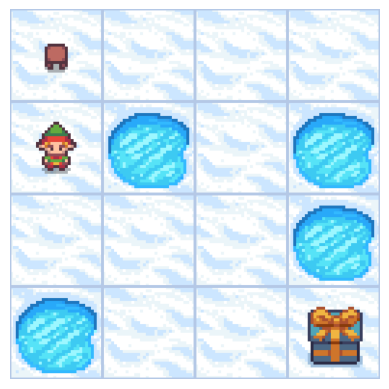

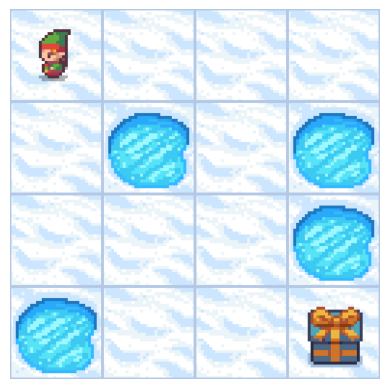

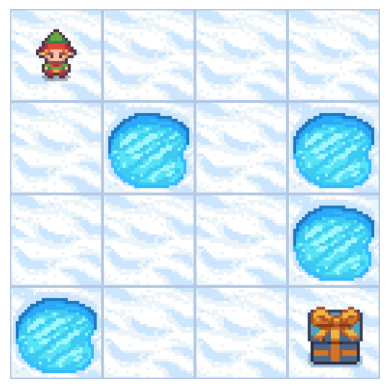

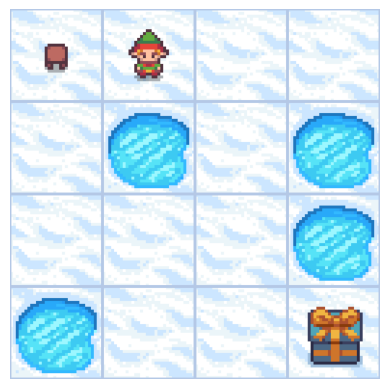

...

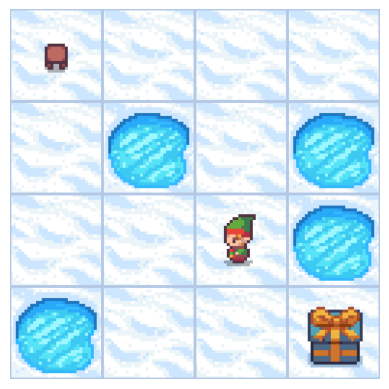

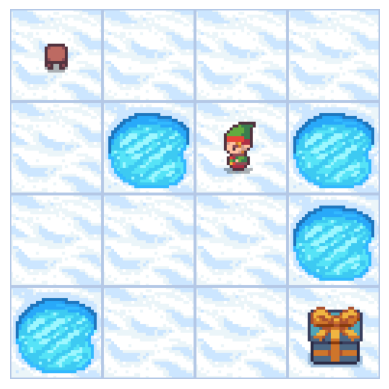

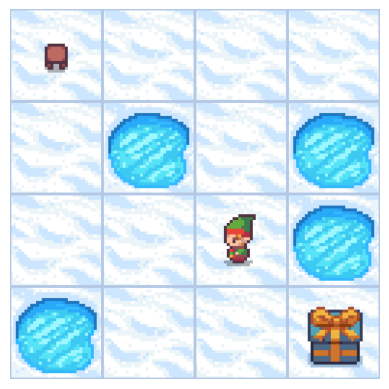

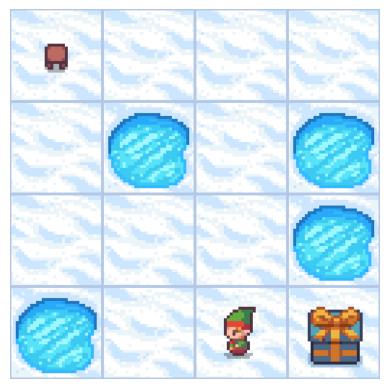

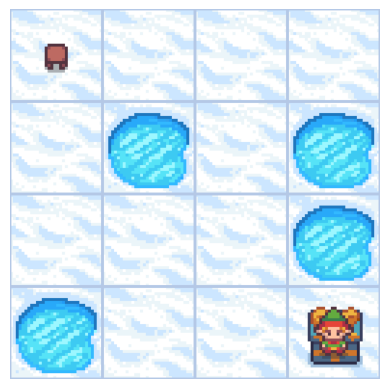

In [21]:
reinforced_learn(0.5)

## Гамма 0.8

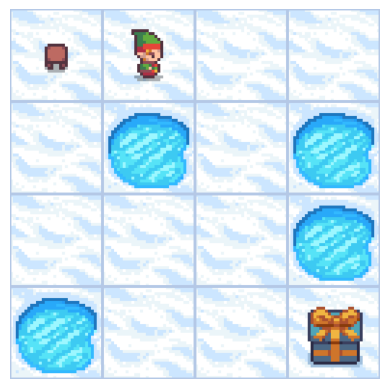

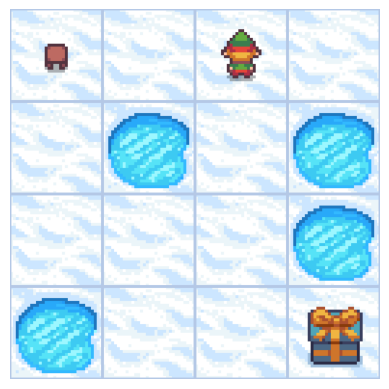

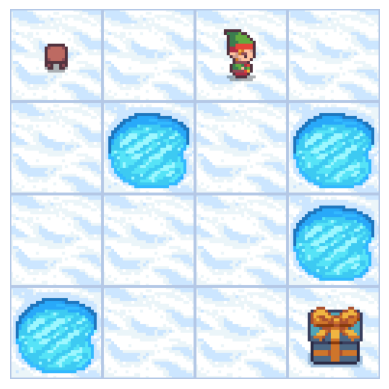

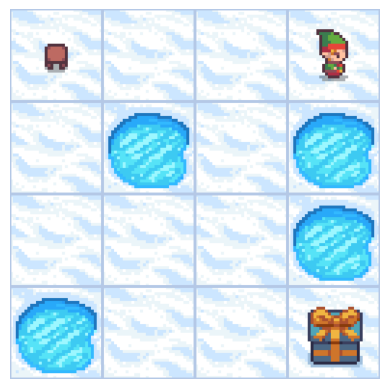

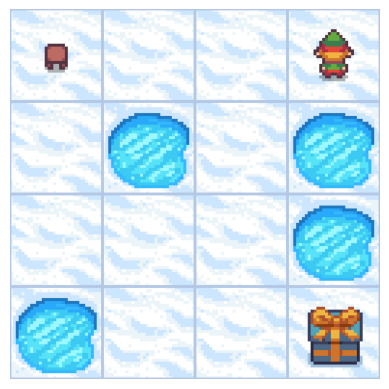

...

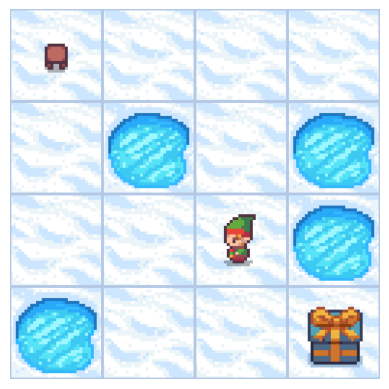

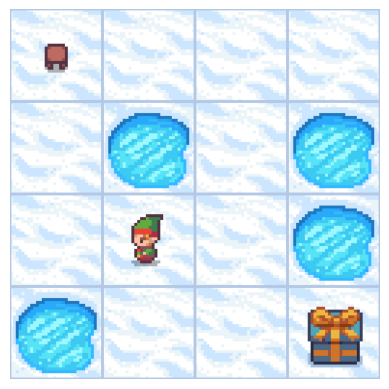

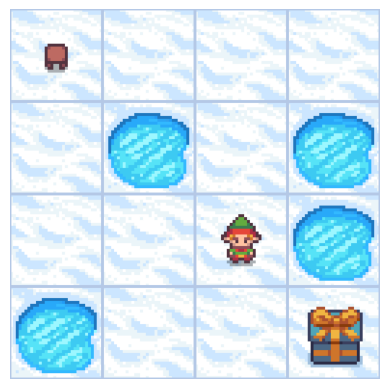

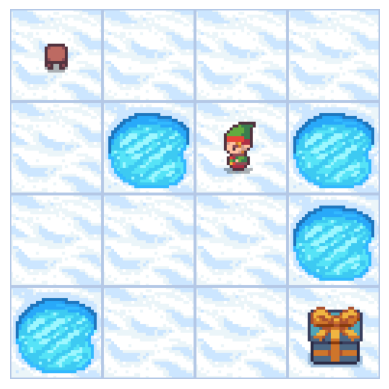

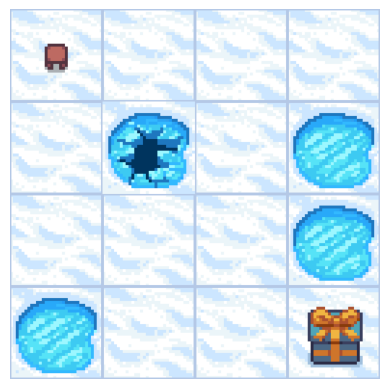

In [22]:
reinforced_learn(0.8)

## Гамма 1.0

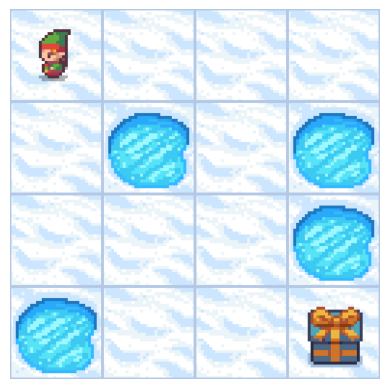

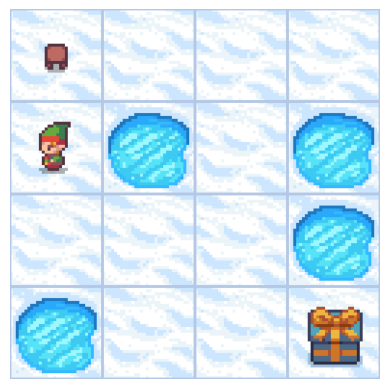

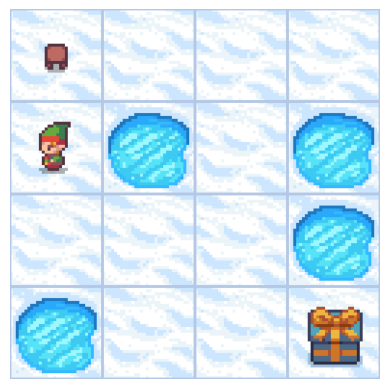

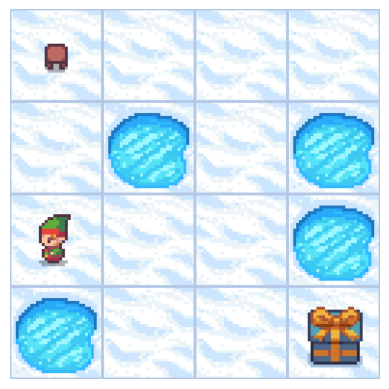

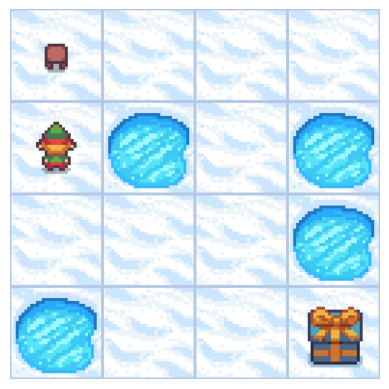

...

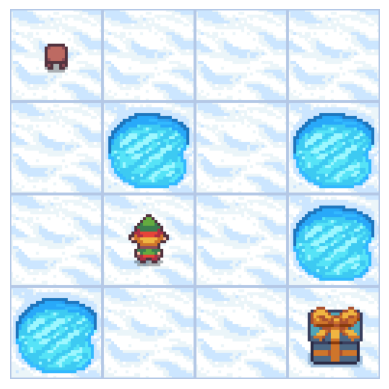

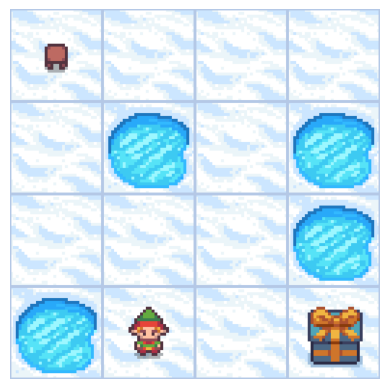

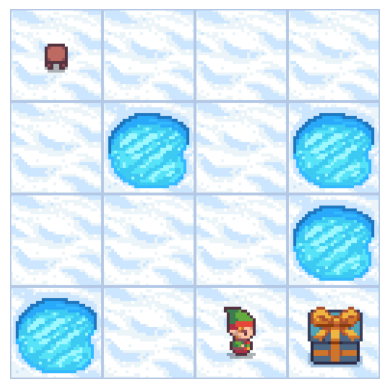

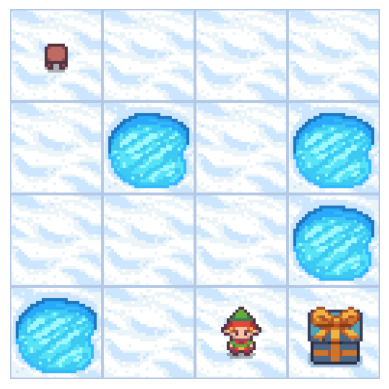

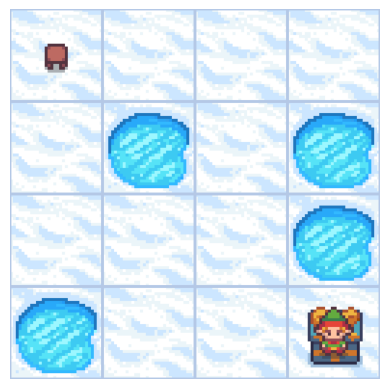

In [23]:
reinforced_learn(1.0)

# 4. Висновки
Як бачимо, даний приклад навчання дійсно навчає гнома пересуватись до правильної, поставленої мети. Як можемо спостерегти по візуалізаціям, агент на початку робить хаотичні рухи і лише з наступними ітераціями його "дії" стають "осмисленими". У моїй реалізації змінним є лише коефіцієнт дисконтування майбутніх винагород. Спостереження показують, що при нульовому чи близькому до нуля значенні агент є доволі "короткозорим" і швидко "гине". Зі збільшенням його агент вчиться більш стратегічно і менше шансів, що він "загине".
